In [8]:
!pip install portalocker>=2.0.0
!pip install transformers
!pip install pytorch_lightning

In [9]:
import torch
import math
import torchtext.vocab as Vocab
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchtext.datasets import IMDB
from torchtext.data.utils import get_tokenizer
from torchtext.vocab import build_vocab_from_iterator
from torch.utils.data import DataLoader
from torch.nn.utils.rnn import pad_sequence

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [10]:
# pour monter son drive Google Drive local
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [11]:
my_local_drive='/content/gdrive/My Drive/Colab Notebooks/transformers'
import sys
# Ajout du path pour les librairies, fonctions et données
sys.path.append(my_local_drive)
# Se positionner sur le répertoire associé
%cd $my_local_drive


%pwd
%ls

/content/gdrive/My Drive/Colab Notebooks/transformers
'=2.0.0'
 checkpoints/
'Copy of translation_transformer.ipynb'
 dataset/
 eng_-french.csv
'kaggle (1).json'
 kaggle.json
 lightning_logs/
 mroedata_translation_transformer.ipynb
 prepare_data.ipynb
 test_dataset.pth
 train_dataset.pth
 translation_transformer.ipynb
 Ttransformer.ipynb


In [12]:
NEG_INF = -1E10
POSITIONAL_ENCODING_DIVISOR = 10000
batch_size=8

In [13]:
from transformers import GPT2Tokenizer
from transformers import BertTokenizer
from torch.utils.data import Dataset
import torch
import pandas as pd
from sklearn.model_selection import train_test_split
import random
import warnings
import numpy as np

# Load the CSV file into a DataFrame
df = pd.read_csv("eng_-french.csv")

# Initialize the BERT and GPT-2 tokenizers
bert_tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-cased')
gpt2_tokenizer = GPT2Tokenizer.from_pretrained('gpt2')

def collate_batch(batch):
    batch = batch[0]
    english_list, french_list = zip(*batch)
    max_len = max(max([len(seq) for seq in english_list]),
                  max([len(seq) for seq in french_list]))
    english_padded = pad_sequence([torch.cat([seq, torch.zeros(max_len - len(seq), dtype=torch.int64)]) for seq in english_list], padding_value=0.0).transpose(0, 1).to(device)
    french_padded = pad_sequence([torch.cat([seq, torch.zeros(max_len - len(seq), dtype=torch.int64)]) for seq in french_list], padding_value=0.0).transpose(0, 1).to(device)
    english_mask = (english_padded != 0).long().to(device)
    french_mask = (french_padded != 0).long().to(device)
    return (english_padded, english_mask), (french_padded, french_mask)

# Create the bucketed dataset
class BucketedDataset(Dataset):
    def __init__(self, data, english_pipeline, french_pipeline, num_buckets):
        self.buckets = {}
        self.batch_size = batch_size
        lengths = [max(len(english_pipeline(english)), len(french_pipeline(french)))
                   for english, french in zip(data['English words/sentences'], data['French words/sentences'])]
        sorted_indices = np.argsort(lengths)
        bucket_size = len(sorted_indices) // num_buckets
        bucket_start = 0
        for i in range(num_buckets):
            start_idx = i * bucket_size
            end_idx = (i + 1) * bucket_size if i != num_buckets - 1 else len(sorted_indices)
            min_len = lengths[sorted_indices[start_idx]]
            max_len = lengths[sorted_indices[end_idx - 1]]
            subset_indices = sorted_indices[start_idx:end_idx]
            self.buckets[(min_len, max_len)] = [(torch.tensor(english_pipeline(data['English words/sentences'].iloc[idx]), dtype=torch.int64),
                                                 torch.tensor(french_pipeline(data['French words/sentences'].iloc[idx]), dtype=torch.int64))
                                                for idx in subset_indices]
        for rng, bucket in self.buckets.items():
            if len(bucket) < batch_size:
                warnings.warn(f"Bucket {rng} has only {len(bucket)} samples which is less than the batch size of {batch_size}. Consider using a different bucketing strategy or oversampling.")
    def __getitem__(self, idx):
        selected_bucket = random.choice(list(self.buckets.keys()))
        return random.sample(self.buckets[selected_bucket], self.batch_size)
    def __len__(self):
        total_sequences = sum([len(bucket) for bucket in self.buckets.values()])
        return total_sequences // self.batch_size

# Data processing pipelines
english_pipeline = lambda x: bert_tokenizer.encode("< " + x + " >", add_special_tokens=False)
french_pipeline = lambda x: gpt2_tokenizer.encode("< " + x + " >", add_special_tokens=False)

# Splitting the data
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)


In [14]:
train_dataset = BucketedDataset(train_df, english_pipeline, french_pipeline,num_buckets=100)
test_dataset = BucketedDataset(test_df, english_pipeline, french_pipeline,num_buckets=100)

# Update data loaders
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True, collate_fn=collate_batch)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, collate_fn=collate_batch)

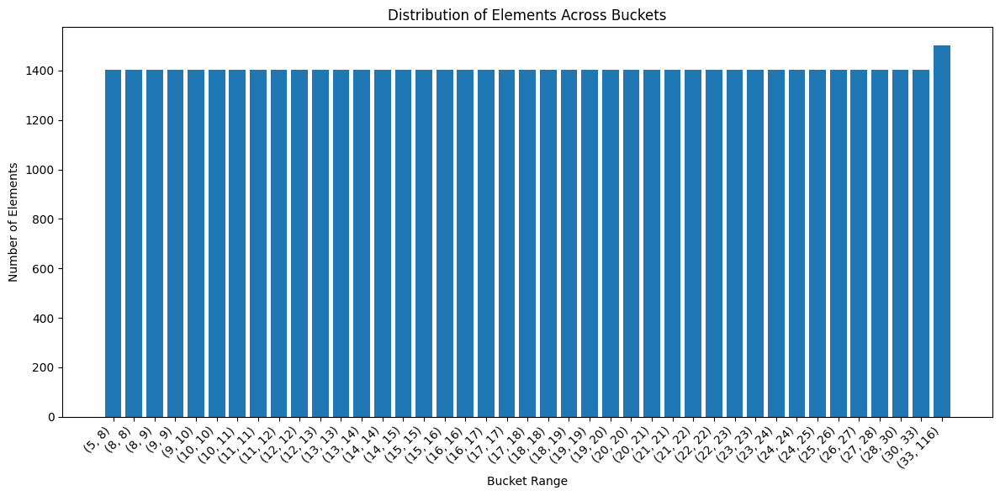

In [15]:
import matplotlib.pyplot as plt
def visualize_buckets(bucketed_dataset):
    # Extract bucket boundaries and counts
    bucket_bounds = [str(bucket) for bucket in bucketed_dataset.buckets.keys()]
    bucket_counts = [len(sequences) for sequences in bucketed_dataset.buckets.values()]

    # Plot
    plt.figure(figsize=(12, 6))
    plt.bar(bucket_bounds, bucket_counts, align='center')
    plt.xlabel('Bucket Range')
    plt.ylabel('Number of Elements')
    plt.title('Distribution of Elements Across Buckets')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Usage:
visualize_buckets(train_dataset)


In [16]:
def display_batch(batch):
    (src_batch,src_batch_m), (tgt_batch,tgt_batch_m) = batch
    for src_ids, tgt_ids in zip(src_batch, tgt_batch):
        src_sentence = bert_tokenizer.decode(src_ids, skip_special_tokens=False)  # We want to see < and > tokens
        tgt_sentence = gpt2_tokenizer.decode(tgt_ids, skip_special_tokens=False)  # Same here
        print(f"Source : {tgt_sentence}")
        print(f"Source : {tgt_ids}\n")
        print(f"Target : {src_sentence}")
        print(f"Target : {src_ids}\n")

# Fetch a batch and display
batch = next(iter(train_loader))
display_batch(batch)


Source : < Savez-vous à quelle heure ce supermarché ferme? >
Source : tensor([   27, 12793,    89,    12, 31222, 28141,   627, 13485,   339,   495,
         2906,  2208,    76,   998,  2634, 11354,  1326,  5633,  1875],
       device='cuda:0')

Target : < Do you know what time that supermarket closes? > [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
Target : tensor([  133, 11791, 13028, 21852, 12976, 10635, 10189, 25212, 60336, 16065,
        10107,   136,   135,     0,     0,     0,     0,     0,     0],
       device='cuda:0')

Source : < La vie en prison est pire que la vie d'un animal. >
Source : tensor([  27, 4689,  410,  494,  551, 3770, 1556,  279,  557, 8358, 8591,  410,
         494,  288,    6,  403, 5044,   13, 1875], device='cuda:0')

Target : < Life in prison is worse than the life of an animal. > [PAD] [PAD] [PAD] [PAD] [PAD]
Target : tensor([   133,  10337,  10106,  20538,  10124, 110353,  11084,  10105,  12103,
         10108,  10151,  18882,    119,    135,      0,      0,      0

In [17]:
from transformers import BertModel

class PositionalWordEmbeddings(nn.Module):
    def __init__(self, vocab_size, embedding_model=None, max_len=3000):
        super().__init__()

        # Word Embeddings
        if embedding_model is None:
            self.word_embed = BertModel.from_pretrained('bert-base-multilingual-cased').to(device)
        else:
            self.word_embed = embedding_model.to(device)

        for param in self.word_embed.parameters():
            param.requires_grad = False  # freeze parameters

        # Positional Embeddings
        self.embed_dim = 768  # You could set this dynamically based on the embedding model
        self.pos_enc = self.positional_encoding(max_len, self.embed_dim)

    def forward(self, sequence, mask=None):
        assert len(sequence.shape) == 2, "Input sequence should be a 2D tensor with shape [batch_size, seq_len]"
        word_embeddings = self.word_embed(sequence, attention_mask=mask)[0]
        return word_embeddings + self.pos_enc[:, :sequence.size(1), :]

    @staticmethod
    def positional_encoding(max_len, embed_dim):
        pos_enc = torch.zeros(max_len, embed_dim)
        for pos in range(max_len):
            for i in range(0, embed_dim, 2):
                pos_enc[pos, i] = math.sin(pos / (POSITIONAL_ENCODING_DIVISOR ** ((2 * i) / embed_dim)))
                if i + 1 < embed_dim:
                    pos_enc[pos, i + 1] = math.cos(pos / (POSITIONAL_ENCODING_DIVISOR ** ((2 * i) / embed_dim)))
        return pos_enc.unsqueeze(0).detach().to(device)

In [18]:
#PositionLinear
class PositionLinear(nn.Module):
  def __init__(self, embed_dim):
        super().__init__()
        self.fc1 = torch.nn.Linear(embed_dim,embed_dim)
        self.fc2 = torch.nn.Linear(embed_dim,embed_dim)

  def forward(self, sequence):
    sequence = torch.nn.ReLU()(self.fc1(sequence))
    return self.fc2(sequence)

In [19]:
class BaseMHSA(nn.Module):
    def __init__(self, embed_dim, num_heads, out_dim, isCausal=False, dropout=0.2):
        super().__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.out_dim = out_dim
        self.isCausal = isCausal
        # K,Q,V for each head
        self.K = nn.Linear(embed_dim, out_dim)
        self.Q = nn.Linear(embed_dim, out_dim)
        self.V = nn.Linear(embed_dim, out_dim)
        self.dropout_layer = nn.Dropout(p=dropout)  # ADD THIS LINE

    def compute_attention_weights(self, Q, K, mask=None):
        W = torch.matmul(Q, K.transpose(2, 3))

        if self.isCausal:
            W += self.get_attention_mask(W)

        # Apply the padding mask to the attention scores
        if mask is not None:
          mask_expanded = mask.unsqueeze(0).unsqueeze(-1).permute(1,0,2,3)
          W = W.masked_fill(mask_expanded == 0, NEG_INF)

        return self.dropout_layer(  # MODIFY THIS LINE
            torch.softmax(W / torch.sqrt(torch.tensor(self.embed_dim)).detach(), dim=-1)
        )

    def get_attention_mask(self, attention_weights):
        mask = torch.triu(torch.ones(attention_weights.size(-2), attention_weights.size(-1)), diagonal=1).to(attention_weights.device) * NEG_INF
        return mask

    def compute_output(self, W, V):
        Y = torch.matmul(W, V)
        Y = Y.permute(0,2,1,3)#put the heads back in last-but-one
        return Y.flatten(start_dim=-2)#flatten heads back to out_dim

class InitialMHSA(BaseMHSA):
    def forward(self, text, mask=None):
        assert len(text.shape) == 3, "Input text should be a 3D tensor with shape [batch_size, seq_len, embed_dim]"
        seq_len = text.shape[1]
        # Calculate Key, Query, and Value
        K = self.K(text).view(text.shape[0], seq_len, self.num_heads, int(self.out_dim/self.num_heads)).permute(0,2,1,3)#one matrix per head
        Q = self.Q(text).view(text.shape[0], seq_len, self.num_heads, int(self.out_dim/self.num_heads)).permute(0,2,1,3)
        V = self.V(text).view(text.shape[0], seq_len, self.num_heads, int(self.out_dim/self.num_heads)).permute(0,2,1,3)
        # Compute attention weights
        W = self.compute_attention_weights(Q, K, mask)
        # Compute the output
        return self.compute_output(W, V)

class FinalMHSA(InitialMHSA):
    def forward(self, text, mask=None):
        assert len(text.shape) == 3, "Input text should be a 3D tensor with shape [batch_size, seq_len, embed_dim]"
        Y = super().forward(text, mask)
        seq_len = text.shape[1]
        K = self.K(text).view(text.shape[0], seq_len, self.num_heads, int(self.out_dim/self.num_heads)).permute(0,2,1,3)#one matrix per head
        Q = self.Q(text).view(text.shape[0], seq_len, self.num_heads, int(self.out_dim/self.num_heads)).permute(0,2,1,3)
        V = self.V(text).view(text.shape[0], seq_len, self.num_heads, int(self.out_dim/self.num_heads)).permute(0,2,1,3)
        return Y, K, V

In [20]:
class DMHSA(BaseMHSA):
    def __init__(self, embed_dim, num_heads, out_dim, isCausal=False, dropout=0.2):
        super().__init__(embed_dim, num_heads, out_dim, isCausal, dropout)
        self.Query = nn.Linear(embed_dim, out_dim)

    def forward(self, sequence, Key, Value, mask=None):
        seq_len = sequence.shape[1]
        # Calculate Query
        Query = self.Query(sequence).view(sequence.shape[0], seq_len, self.num_heads, int(self.out_dim/self.num_heads)).permute(0,2,1,3)#one matrix per head
        # Compute attention weights
        W = self.compute_attention_weights(Query, Key, mask)
        # Compute the output
        return self.compute_output(W, Value)

In [21]:
class NonCausalBlock(nn.Module):
  def __init__(self, embed_dim, num_heads, out_dim, isFinal=False, dropout=0.2):
        super().__init__()
        self.isResidual = embed_dim==out_dim#the first residual connection cannot happen if we change dimension
        self.isFinal = isFinal
        # Conditionally create either InitialMHSA or FinalMHSA
        if isFinal:
            self.MHSA = FinalMHSA(embed_dim, num_heads, out_dim, dropout=dropout)
        else:
            self.MHSA = InitialMHSA(embed_dim, num_heads, out_dim, dropout=dropout)
        #PositionLinear
        self.position_linear = PositionLinear(out_dim)
        #alpha is the rezero parameter
        self.alpha = nn.Parameter(torch.tensor(0.0))

  def forward(self, text, mask=None):
    assert len(text.shape) == 3, "Input sequence should be a 3D tensor with shape [batch_size, seq_len, embed_dim]"
    start = text
    if self.isFinal:
        transformed_text, Key, Value = self.MHSA(text, mask)  # Pass the mask
    else:
        transformed_text = self.MHSA(text, mask)  # Pass the mask
        if self.isResidual:
          transformed_text,text = transformed_text*self.alpha + text,transformed_text*self.alpha + text #residual connection
        else:
          text = transformed_text
        transformed_text = self.position_linear(transformed_text)
        transformed_text,text = transformed_text*self.alpha + text, transformed_text*self.alpha + text #residual connection
    if self.isFinal:
        return Key, Value
    else:
        return transformed_text

In [22]:
class CausalBlock(nn.Module):
  def __init__(self, embed_dim, num_heads, out_dim, dropout=0.2):
        super().__init__()
        self.isResidual = embed_dim==out_dim
        #MHSA
        self.MHSA = InitialMHSA(embed_dim,num_heads,out_dim, isCausal=True, dropout=dropout)
        #DMHSA
        self.DMHSA = DMHSA(out_dim,num_heads,out_dim, isCausal=True, dropout=dropout)
        #PositionLinear
        self.position_linear = PositionLinear(out_dim)
        #alpha is the rezero parameter
        self.alpha = nn.Parameter(torch.tensor(0.0))

  def forward(self, text, Key,Value, mask=None):
    start = text
    assert len(text.shape) == 3, "Input text should be a 3D tensor with shape [batch_size, seq_len, embed_dim]"
    transformed_text = self.MHSA(text, mask)  # Pass the mask
    if self.isResidual:
      transformed_text,text = transformed_text*self.alpha + text, transformed_text*self.alpha + text #residual connection
    else:
      text = transformed_text

    transformed_text = self.DMHSA(transformed_text, Key, Value, mask)  # Pass the mask
    transformed_text,text = transformed_text*self.alpha + text, transformed_text*self.alpha + text #residual connection

    transformed_text = self.position_linear(transformed_text)
    transformed_text,text = transformed_text*self.alpha + text, transformed_text*self.alpha + text #residual connection
    return transformed_text#add k and v for the next blocks

In [23]:
class TransformerEncoder(nn.Module):
    def __init__(self, vocab_size, num_heads, hidden_dim, num_blocks, embedding_model=None, dropout=0.2, max_len=3000):
        super().__init__()
        self.embed_dim = 768  # You could set this dynamically based on the embedding model

        # Embeddings
        self.embeddings = PositionalWordEmbeddings(vocab_size, embedding_model=embedding_model, max_len=max_len)

        # List of blocks
        blocks = [NonCausalBlock(self.embed_dim, num_heads, hidden_dim, dropout=dropout)]
        blocks += [NonCausalBlock(hidden_dim, num_heads, hidden_dim, dropout=dropout) for _ in range(num_blocks-1)]
        blocks.append(NonCausalBlock(hidden_dim, num_heads, hidden_dim, isFinal=True, dropout=dropout))
        self.blocks = nn.Sequential(*blocks)

    def forward(self, sequence, mask=None):
        assert len(sequence.shape) == 2, "Input sequence should be a 2D tensor with shape [batch_size, seq_len]"
        sequence = self.embeddings(sequence, mask)
        for block in self.blocks:
            sequence = block(sequence, mask)
        Key, Value = sequence
        return Key, Value


In [24]:
from transformers import GPT2Model

class TransformerDecoder(nn.Module):
    def __init__(self, vocab_size, num_heads, hidden_dim, num_blocks, dropout=0.2, max_len=3000):
        super().__init__()
        self.embed_dim = 768  # GPT-2's dimensionality is 768

        # GPT-2 Embeddings (pretrained, causal)
        gpt2_embed_model = GPT2Model.from_pretrained('gpt2')

        # Freeze the GPT-2 parameters
        for param in gpt2_embed_model.parameters():
            param.requires_grad = False

        # Embeddings
        self.embeddings = PositionalWordEmbeddings(vocab_size, embedding_model=gpt2_embed_model, max_len=max_len)

        # List of blocks
        blocks = [CausalBlock(self.embed_dim, num_heads, hidden_dim, dropout=dropout)]
        blocks += [CausalBlock(hidden_dim, num_heads, hidden_dim, dropout=dropout) for _ in range(num_blocks-1)]
        self.blocks = nn.Sequential(*blocks)

        # Final linear output maps to label probabilities
        self.final = nn.Linear(hidden_dim, vocab_size)

    def forward(self, sequence, K, V, mask):
        assert len(sequence.shape) == 2, "Input sequence should be a 2D tensor with shape [batch_size, seq_len]"
        sequence = self.embeddings(sequence, mask)
        for block in self.blocks:
            sequence = block(sequence, K, V, mask)
        sequence = self.final(sequence)
        return sequence

In [35]:
class Transformer(nn.Module):
    def __init__(self, num_heads, hidden_dim, num_blocks, max_len=3000, dropout=0.2):
        super(Transformer, self).__init__()
        self.encoder = TransformerEncoder(len(bert_tokenizer.vocab), num_heads=num_heads, hidden_dim=hidden_dim, num_blocks=num_blocks, max_len=max_len)
        self.decoder = TransformerDecoder(len(gpt2_tokenizer), num_heads, hidden_dim, num_blocks, max_len=max_len, dropout=dropout)


    def forward(self, src_text, src_mask, tgt_text, tgt_mask):
        Key, Value = self.encoder(src_text, src_mask)
        output = self.decoder(tgt_text, Key, Value, tgt_mask)
        return output


In [36]:
from pytorch_lightning.callbacks import ModelCheckpoint

class CustomModelCheckpoint(ModelCheckpoint):

    def _save_model(self, trainer, filepath, overwrite):
        model = trainer.lightning_module

        # Get the full state dict
        model_dict = model.state_dict()

        # Initialize a new dictionary to store the items we want to save
        clean_dict = {}

        for key, value in model_dict.items():
            # Skip saving GPT-2 and BERT weights
            if 'embeddings.word_embed' in key:
                continue
            clean_dict[key] = value

        # Save the cleaned state dict
        torch.save(clean_dict, filepath)

In [37]:
import pytorch_lightning as pl

class LitTransformer(pl.LightningModule):
    def __init__(self, num_heads, hidden_dim, num_blocks, train_dataloader, max_len=3000, dropout=0.2):
        super(LitTransformer, self).__init__()
        self.transformer = Transformer(num_heads, hidden_dim, num_blocks, max_len=max_len, dropout=dropout)
        self.loss = nn.CrossEntropyLoss(ignore_index=0)  # Cross-entropy loss for translation tasks -- ignores padding tokens
        self.save_hyperparameters()

    def forward(self, src_text, src_mask, tgt_text, tgt_mask):
        return self.transformer(src_text, src_mask, tgt_text, tgt_mask)

    def training_step(self, batch, batch_idx):
        (src_batch, src_mask), (tgt_batch, tgt_mask) = batch
        src_batch, src_mask, tgt_batch, tgt_mask = src_batch.to(device), src_mask.to(device), tgt_batch.to(device), tgt_mask.to(device)
        outputs = self(src_batch, src_mask, tgt_batch[:,:-1], tgt_mask[:,:-1])
        tgt_labels = tgt_batch[:, 1:]
        loss = self.loss(outputs.reshape(outputs.size(0)*outputs.size(1), outputs.size(2)), tgt_labels.reshape(-1))
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        # Extract the current learning rate and log it
        lr = self.optimizers().param_groups[0]['lr']
        self.log('lr', lr, on_step=True, on_epoch=False, prog_bar=True, logger=False)
        return loss

    def validation_step(self, batch, batch_idx):
        (src_batch, src_mask), (tgt_batch, tgt_mask) = batch
        src_batch, src_mask, tgt_batch, tgt_mask = src_batch.to(device), src_mask.to(device), tgt_batch.to(device), tgt_mask.to(device)
        outputs = self(src_batch, src_mask, tgt_batch[:,:-1], tgt_mask[:,:-1])
        tgt_labels = tgt_batch[:, 1:]
        outputs = self(src_batch, src_mask, tgt_batch[:,:-1], tgt_mask[:,:-1])
        tgt_labels = tgt_batch[:, 1:]
        loss = self.loss(outputs.reshape(outputs.size(0)*outputs.size(1), outputs.size(2)), tgt_labels.reshape(-1))
        self.log('val_loss', loss, on_step=True, on_epoch=True, prog_bar=True, logger=True)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=.00008, betas=(0.9, 0.98), eps=1e-9)
        return [optimizer]

test gradient statistics for untrained feedforward

In [38]:
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 100
from torchvision import transforms
import torch
import numpy as np
import io
from PIL import Image

def create_masks(tensor):
    return (tensor != 0).long().to(device)

def gradient_statistics(model, data_loader):
    (src_batch, src_mask), (tgt_batch, tgt_mask) = next(iter(data_loader))
    src_batch, src_mask, tgt_batch, tgt_mask = src_batch.to(device), src_mask.to(device), tgt_batch.to(device), tgt_mask.to(device)

    outputs = model(src_batch, src_mask, tgt_batch[:,:-1], tgt_mask[:,:-1])
    tgt_labels = tgt_batch[:, 1:]
    loss = model.loss(outputs.reshape(outputs.size(0)*outputs.size(1), outputs.size(2)), tgt_labels.reshape(-1))

    model.zero_grad()
    loss.backward()
    print(loss)

    mean_gradients = []
    var_gradients = []
    layer_names = []
    weight_params = [(name,param) for name, param in model.named_parameters() if 'weight' in name or 'alpha' in name]
    for name, param in weight_params:
        if param.grad is not None:
            mean_gradients.append(torch.abs(torch.mean(param.grad)).item())
            var_gradients.append(torch.var(param.grad).item())
            layer_names.append(name)

    plt.figure(figsize=(100, 30))
    plt.subplot(2,1, 1)
    plt.bar(layer_names, mean_gradients)
    plt.xticks(rotation=85, fontsize=15)
    plt.title('Mean of Gradients')

    plt.subplot(2,1, 2)
    plt.bar(layer_names, var_gradients)
    plt.xticks(rotation=85, fontsize=15)
    plt.title('Variance of Gradients')

    plt.subplots_adjust(hspace=0.5)
    plt.show()


tensor(13.4001, device='cuda:0', grad_fn=<NllLossBackward0>)


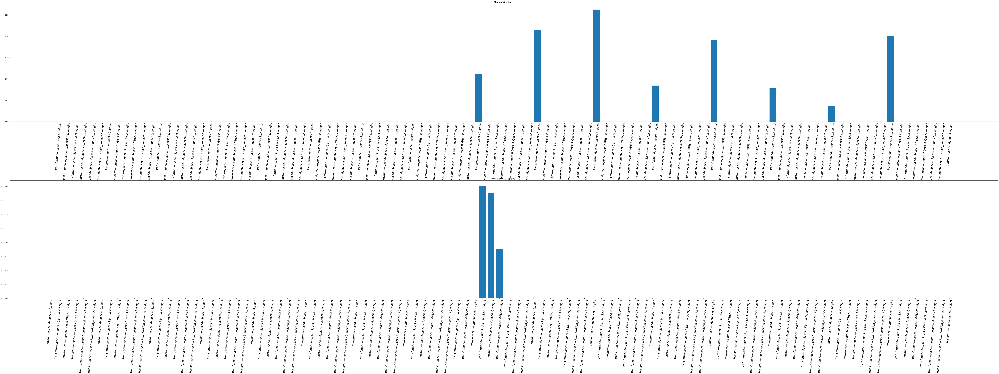

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [39]:
from pytorch_lightning import Trainer
import logging
import torch

# Instantiate the model
num_heads = 8
hidden_dim = 512
num_blocks = 8
max_len = 3000

model = LitTransformer(num_heads, hidden_dim, num_blocks, train_loader, max_len=max_len).to(device)

# Instantiate the custom "save best" checkpoint:
checkpoint_callback = CustomModelCheckpoint(
    monitor='val_loss',
    dirpath='checkpoints/',  # Directory where the checkpoints will be saved
    filename='best-checkpoint',  # Checkpoint file name. It will append ".ckpt" to the name
    save_top_k=1,  # Only the top 1 model will be saved
    mode='min'  # 'min' will save the model when `val_loss` is minimized
)

# Assuming you already have train_loader and test_loader prepared
train_dataloader = train_loader
val_dataloader = test_loader

gradient_statistics(model, train_dataloader)

# Training setup
trainer = Trainer(
    callbacks=[checkpoint_callback],
    devices=1,   # Use 1 GPU
    accumulate_grad_batches=8, #b_size=64
    max_epochs=10
)

tensor(1.8291, device='cuda:0', grad_fn=<NllLossBackward0>)


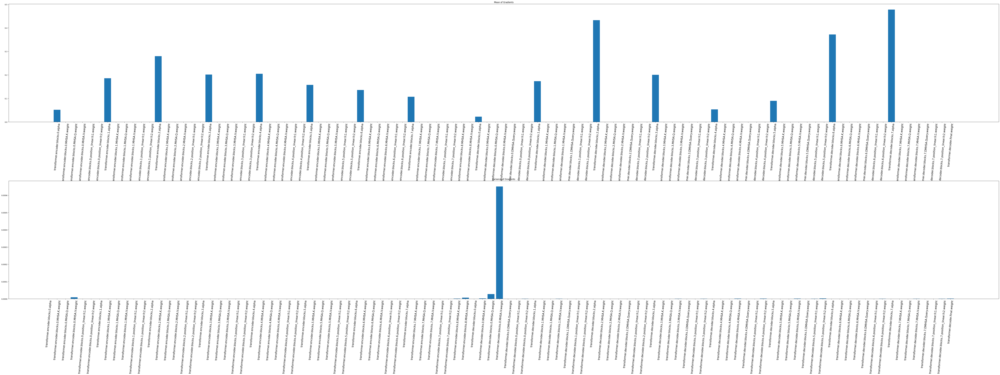

In [65]:
gradient_statistics(model, train_dataloader)

In [40]:
# Uncomment the next line if you want to train the model
trainer.fit(model, train_dataloader, val_dataloader)

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:617: UserWarning: Checkpoint directory /content/gdrive/MyDrive/Colab Notebooks/transformers/checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type             | Params
-------------------------------------------------
0 | transformer | Transformer      | 359 M 
1 | loss        | CrossEntropyLoss | 0     
-------------------------------------------------
57.3 M    Trainable params
302 M     Non-trainable params
359 M     Total params
1,438.369 Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [42]:
from transformers import BertTokenizer, GPT2Tokenizer

# Initialize BERT and GPT-2 tokenizers
bert_tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-cased')
gpt2_tokenizer = GPT2Tokenizer.from_pretrained('gpt2')

# Assuming `lit_transformer` is your trained model
lit_transformer = lit_transformer.eval().to(device)

# Import necessary libraries
import torch.nn.functional as F

# 1. Load a batch
(src_text, src_mask), (tgt_text, tgt_mask) = next(iter(test_loader))
src_text, src_mask, tgt_text, tgt_mask = src_text.to(device), src_mask.to(device), tgt_text.to(device), tgt_mask.to(device)

# 2. Display the decoded sentences using the appropriate tokenizers
print("Original English Sentences:")
for seq in src_text:
    print(bert_tokenizer.decode(seq))

print("\nOriginal French Sentences:")
for seq in tgt_text:
    print(gpt2_tokenizer.decode(seq))

# 3. Feed the sentences through the network
with torch.no_grad():
    model_output = lit_transformer(src_text, src_mask, tgt_text[:, :-1], tgt_mask[:, :-1])

# 4. Display the model's translation

# Soft Probabilities
probs = F.softmax(model_output, dim=-1)

# As tokens
token_ids = torch.argmax(probs, dim=-1)

# As decoded tokens using GPT-2 tokenizer
print("\nDecoded Translations:")
for seq in token_ids:
    print(gpt2_tokenizer.decode(seq))

# (Optional) Get gradient statistics
# gradient_statistics(model, train_loader)


Original English Sentences:
< He said that he would be eighteen on his next birthday. > [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
< Which do you like better, meat or fish? > [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
< Do you have a flashlight I could borrow? > [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
< Tom was mauled by a dog when he was a kid. > [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
< Within hours, the world knew the news. > [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
< She helped him tie his tie because he didn't know how to. > [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
< They manage to get along without much money. > [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]
< The new computer is ten times as fast as the old one. > [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]

Original French Sentences:
< Il disait qu'il aurait dix-huit ans à son procha

In [ ]:
src_text

In [43]:
%load_ext tensorboard
%tensorboard --logdir=lightning_logs

Output hidden; open in https://colab.research.google.com to view.

In [60]:
from transformers import BertTokenizer, GPT2Tokenizer
import torch.nn.functional as F
import torch

# Initialize BERT and GPT-2 tokenizers
bert_tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-cased')
gpt2_tokenizer = GPT2Tokenizer.from_pretrained('gpt2')

def translate_using_autoregressive(sentence, model, src_tokenizer, tgt_tokenizer, max_length=100, device='cuda'):
    model.eval()

    # Tokenize the input sentence and add batch dimension
    tokenized_input = src_tokenizer.encode(sentence, return_tensors="pt").to(device)
    input_mask = torch.ones_like(tokenized_input)

    # Initialize the target sequence with the token "<"
    tgt_text = torch.tensor([[tgt_tokenizer.encode("<")[0]]], device=device)

    # Create target mask
    tgt_mask = torch.ones_like(tgt_text)

    translated_tokens = []

    for i in range(1, max_length):
        with torch.no_grad():
            output = model(tokenized_input, input_mask, tgt_text, tgt_mask)
            probs = F.softmax(output[:, -1], dim=-1)
            next_token = torch.argmax(probs, dim=-1).unsqueeze(1)
            tgt_text = torch.cat([tgt_text, next_token], dim=-1)

            # Update the target mask
            tgt_mask = torch.ones_like(tgt_text)

            # Append the token to our list
            translated_tokens.append(next_token[0].item())

            # Break the loop if the EOS token is generated
            if next_token[0].item() == tgt_tokenizer.encode(" >", add_special_tokens=False)[0]:
                break

    # Convert the token IDs to text using the target tokenizer
    translation = tgt_tokenizer.decode(translated_tokens, skip_special_tokens=True)

    return translation

# Example usage
sentence = "< If you, an artist, the one who cannot manage figures, you look like an orator who cannot manage words. Leonardo da Vinci >"
translated_sentence = translate_using_autoregressive(sentence, lit_transformer, bert_tokenizer, gpt2_tokenizer)
print(f"Original: {sentence}\nTranslated: {translated_sentence}")

Original: < If you, an artist, the one who cannot manage figures, you look like an orator who cannot manage words. Leonardo da Vinci >
Translated:  Si tu ne sais pas un homme, mais je ne peux pas le mot de lire. >


#BEAM search step by step stranslation

In [61]:
from transformers import BertTokenizer, GPT2Tokenizer
import torch.nn.functional as F
import torch

# Initialize BERT and GPT-2 tokenizers
bert_tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-cased')
gpt2_tokenizer = GPT2Tokenizer.from_pretrained('gpt2')

def translate_using_beam_search(sentence, model, src_tokenizer, tgt_tokenizer, beam_size=5, max_length=100, length_penalty=0.6, device='cuda'):
    model.eval()

    # Tokenize the input sentence and add batch dimension
    tokenized_input = src_tokenizer.encode(sentence, return_tensors="pt").to(device)
    input_mask = torch.ones_like(tokenized_input)

    # Initialize the beam with the starting token
    start_token = tgt_tokenizer.encode("<", add_special_tokens=False)[0]
    beams = [([start_token], 0)] * beam_size

    for i in range(1, max_length):
        new_beams = []

        for tokens, score in beams:
            # If this beam already generated the end token, add to new_beams and continue
            if tokens[-1] == tgt_tokenizer.encode(" >", add_special_tokens=False)[0]:
                new_beams.append((tokens, score))
                continue

            # Prepare the target tensor
            tgt_text = torch.tensor([tokens], device=device)
            tgt_mask = torch.ones_like(tgt_text)

            with torch.no_grad():
                output = model(tokenized_input, input_mask, tgt_text, tgt_mask)
                probs = F.softmax(output[0, len(tokens) - 1], dim=-1)
                top_probs, top_tokens = torch.topk(probs, beam_size)

                for prob, token in zip(top_probs, top_tokens):
                    new_score = score - prob.log().item()  # Use negative log probability
                    new_score /= (len(tokens) + 1)**length_penalty  # Apply length normalization
                    new_beams.append((tokens + [token.item()], new_score))

        # Keep the top `beam_size` beams
        new_beams.sort(key=lambda x: x[1], reverse=True)
        beams = new_beams[:beam_size]

    # Extract the best beam (lowest score)
    best_tokens, best_score = beams[0]

    # Convert the token IDs to text using the target tokenizer
    translation = tgt_tokenizer.decode(best_tokens, skip_special_tokens=True)

    return translation

# Example usage:
sentence = "< If you, an artist, the one who cannot manage figures, you look like an orator who cannot manage words. Leonardo da Vinci >"
translated_sentence = translate_using_beam_search(sentence, lit_transformer, bert_tokenizer, gpt2_tokenizer, beam_size=3)
print(f"Original: {sentence}\nTranslated: {translated_sentence}")


Original: < If you, an artist, the one who cannot manage figures, you look like an orator who cannot manage words. Leonardo da Vinci >
Translated: < Siens ne passe, un peine le plus mot que je pu ne le puisaissage, pas dire de la maucher non non non non non non le mot mot motment, moti que vraigne non mot que autre moti non mote non moti non mote ne moti ne mot. » ne mot que autne peu pas non pas aute non aute non ne mot, non que ne mot pas non aut. non
